In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings('ignore')

In [2]:
np.random.seed(42)
tf.random.set_seed(42)

In [4]:
DATA_PATH = '/kaggle/input/datacoin/data'

In [33]:
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 16 
EPOCHS = 150

In [34]:
def load_dataset_with_splits(data_path):
    data_dir = Path(data_path)
    
    splits = [d.name for d in data_dir.iterdir() if d.is_dir()]
    print(f"Found splits: {splits}")
    
    train_dir = data_dir / 'train'
    class_dirs = [d for d in train_dir.iterdir() if d.is_dir()]
    class_names = sorted([d.name for d in class_dirs])
    
    print(f"\nFound {len(class_names)} classes: {class_names}")
    
    def load_split(split_name):
        images = []
        labels = []
        split_path = data_dir / split_name
        
        if not split_path.exists():
            return np.array([]), np.array([])
        
        print(f"\nLoading {split_name} split:")
        for class_idx, class_name in enumerate(class_names):
            class_path = split_path / class_name
            if not class_path.exists():
                print(f"  {class_name}: 0 images (folder not found)")
                continue
                
            image_files = (list(class_path.glob('*.jpg')) + 
                          list(class_path.glob('*.png')) + 
                          list(class_path.glob('*.jpeg')) +
                          list(class_path.glob('*.JPG')) +
                          list(class_path.glob('*.PNG')))
            
            print(f"  {class_name}: {len(image_files)} images")
            
            for img_path in image_files:
                try:
                    img = cv2.imread(str(img_path))
                    if img is not None:
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
                        images.append(img)
                        labels.append(class_idx)
                except Exception as e:
                    print(f"    Error loading {img_path}: {e}")
        
        return np.array(images), np.array(labels)
    
    X_train, y_train = load_split('train')
    X_val, y_val = load_split('valid')
    X_test, y_test = load_split('test')
    
    return X_train, y_train, X_val, y_val, X_test, y_test, class_names

print("Loading dataset...")
X_train_raw, y_train, X_val_raw, y_val, X_test_raw, y_test, class_names = load_dataset_with_splits(DATA_PATH)

print(f"\n{'='*50}")
print("DATASET SUMMARY")
print(f"{'='*50}")
print(f"Train set: {X_train_raw.shape[0]} images")
print(f"Validation set: {X_val_raw.shape[0]} images") 
print(f"Test set: {X_test_raw.shape[0]} images")
print(f"Total images: {X_train_raw.shape[0] + X_val_raw.shape[0] + X_test_raw.shape[0]}")
print(f"Number of classes: {len(class_names)}")

Loading dataset...
Found splits: ['valid', 'test', 'train']

Found 9 classes: ['1', '10', '10 (new)', '100', '20', '20 (new)', '200', '5', '50']

Loading train split:
  1: 60 images
  10: 315 images
  10 (new): 317 images
  100: 315 images
  20: 322 images
  20 (new): 346 images
  200: 313 images
  5: 334 images
  50: 315 images

Loading valid split:
  1: 20 images
  10: 80 images
  10 (new): 130 images
  100: 80 images
  20: 80 images
  20 (new): 130 images
  200: 80 images
  5: 80 images
  50: 80 images

Loading test split:
  1: 20 images
  10: 35 images
  10 (new): 30 images
  100: 35 images
  20: 35 images
  20 (new): 30 images
  200: 35 images
  5: 35 images
  50: 35 images

DATASET SUMMARY
Train set: 2637 images
Validation set: 760 images
Test set: 290 images
Total images: 3687
Number of classes: 9


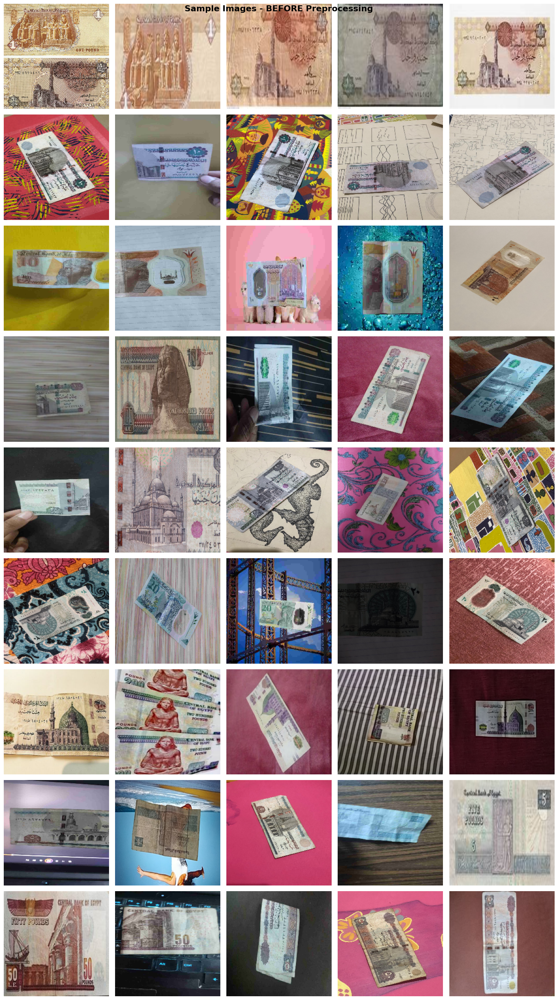

In [35]:
fig, axes = plt.subplots(len(class_names), 5, figsize=(15, len(class_names)*3))
if len(class_names) == 1:
    axes = axes.reshape(1, -1)
fig.suptitle('Sample Images - BEFORE Preprocessing', fontsize=16, fontweight='bold')

for class_idx, class_name in enumerate(class_names):
    class_indices = np.where(y_train == class_idx)[0]
    if len(class_indices) > 0:
        n_samples = min(5, len(class_indices))
        random_indices = np.random.choice(class_indices, n_samples, replace=False)
        
        for col_idx in range(5):
            if col_idx < n_samples:
                img_idx = random_indices[col_idx]
                axes[class_idx, col_idx].imshow(X_train_raw[img_idx])
                if col_idx == 0:
                    axes[class_idx, col_idx].set_ylabel(f'{class_name}', 
                                                        fontsize=11, fontweight='bold')
            axes[class_idx, col_idx].axis('off')

plt.tight_layout()
plt.savefig('samples_before.png', dpi=150, bbox_inches='tight')
plt.show()

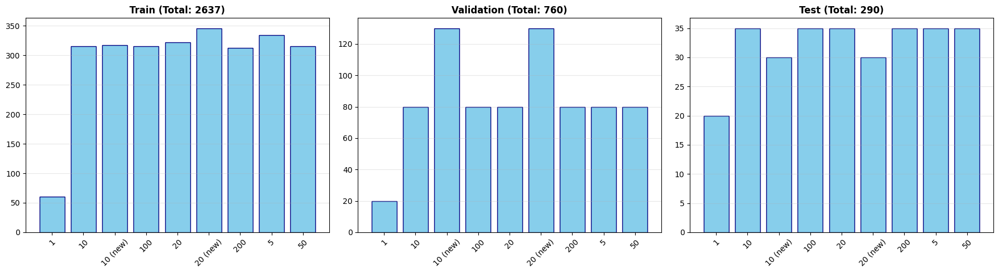

In [36]:
# Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for idx, (split_name, y_split) in enumerate([('Train', y_train), ('Validation', y_val), ('Test', y_test)]):
    if len(y_split) > 0:
        unique, counts = np.unique(y_split, return_counts=True)
        axes[idx].bar([class_names[i] for i in unique], counts, color='skyblue', edgecolor='navy')
        axes[idx].set_title(f'{split_name} (Total: {len(y_split)})', fontsize=12, fontweight='bold')
        axes[idx].tick_params(axis='x', rotation=45)
        axes[idx].grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('distribution.png', dpi=150, bbox_inches='tight')
plt.show()

In [39]:
print("\nPreprocessing data...")

# Normalize
X_train = X_train_raw.astype('float32') / 255.0
X_val = X_val_raw.astype('float32') / 255.0
X_test = X_test_raw.astype('float32') / 255.0

# Convert to categorical
num_classes = len(class_names)
y_train_cat = keras.utils.to_categorical(y_train, num_classes)
y_val_cat = keras.utils.to_categorical(y_val, num_classes)
y_test_cat = keras.utils.to_categorical(y_test, num_classes)


Preprocessing data...


In [42]:

def build_enhanced_cnn(input_shape, num_classes):

    
    inputs = layers.Input(shape=input_shape)
    
    # Block 1
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu', 
                      kernel_regularizer=regularizers.l2(0.0001))(inputs)
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.SpatialDropout2D(0.15)(x)
    
    # Block 2
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.SpatialDropout2D(0.15)(x)
    
    # Block 3
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.SpatialDropout2D(0.2)(x)
    
    # Block 4
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.SpatialDropout2D(0.25)(x)
    
    # Block 5
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu',
                      kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.SpatialDropout2D(0.25)(x)
    
    # Global pooling
    x = layers.GlobalAveragePooling2D()(x)
    
    # Dense layers with careful regularization
    x = layers.Dense(1024, activation='relu', 
                     kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    
    x = layers.Dense(512, activation='relu',
                     kernel_regularizer=regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    
    # Output with label smoothing (applied in loss)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Build model
model = build_enhanced_cnn((IMG_HEIGHT, IMG_WIDTH, 3), num_classes)

# Compile with label smoothing and optimized LR
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.0001),
    loss=keras.losses.CategoricalCrossentropy(label_smoothing=0.1),  # Smoothing helps!
    metrics=['accuracy']
)

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_51 (Conv2D)              │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_52 (Conv2D)              │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d               │ (None, 112, 112, 64)   │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_53 (Conv2D)              │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_54 (Conv2D)              │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d_1             │ (None, 56, 56, 128)    │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 56, 56, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d_2             │ (None, 28, 28, 256)    │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_60 (Conv2D)              │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 28, 28, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 13,421,641 (51.20 MB)

 Trainable params: 13,415,625 (51.18 MB)

 Non-trainable params: 6,016 (23.50 KB)

In [43]:
# ==================== CALLBACKS ====================
early_stop = callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=30,
    restore_best_weights=True,
    verbose=1
)

checkpoint = callbacks.ModelCheckpoint(
    'best_currency_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=8,
    min_lr=1e-7,
    verbose=1
)

In [44]:
print("\n" + "="*50)
print("TRAINING MODEL")
print("="*50)

history = model.fit(
    X_train, y_train_cat,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=(X_val, y_val_cat),
    callbacks=[early_stop, checkpoint, reduce_lr],
    verbose=1
)


TRAINING MODEL
Epoch 1/150
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - accuracy: 0.1125 - loss: 3.7603
Epoch 1: val_accuracy improved from -inf to 0.10526, saving model to best_currency_model.keras
165/165 ━━━━━━━━━━━━━━━━━━━━ 64s 244ms/step - accuracy: 0.1126 - loss: 3.7595 - val_accuracy: 0.1053 - val_loss: 3.0624 - learning_rate: 1.0000e-04
Epoch 2/150
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.1390 - loss: 3.4233
Epoch 2: val_accuracy improved from 0.10526 to 0.11184, saving model to best_currency_model.keras
165/165 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - accuracy: 0.1390 - loss: 3.4233 - val_accuracy: 0.1118 - val_loss: 3.3194 - learning_rate: 1.0000e-04
Epoch 3/150
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.1403 - loss: 3.4402
Epoch 3: val_accuracy improved from 0.11184 to 0.13158, saving model to best_currency_model.keras
165/165 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - accuracy: 0.1403 - loss: 3.4402 - val_accuracy: 0.1316 - val_loss: 3.0291 - learning

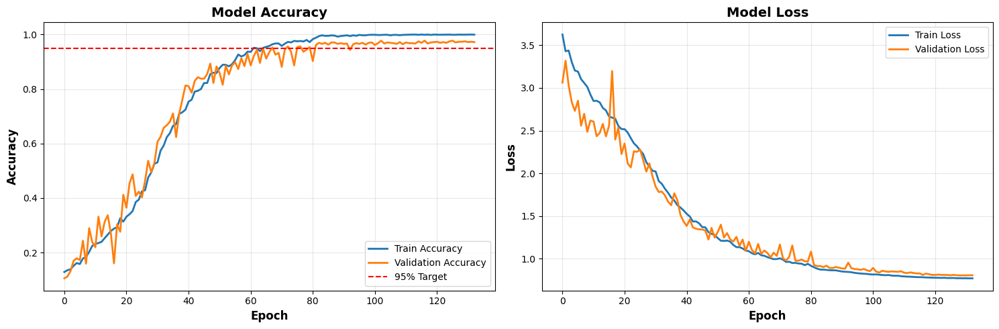


MODEL EVALUATION

 TEST ACCURACY: 98.97%
 TEST LOSS: 0.8082

 VALIDATION ACCURACY: 97.76%
 VALIDATION LOSS: 0.8385

CLASSIFICATION REPORT
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        20
          10       0.97      1.00      0.99        35
    10 (new)       0.97      1.00      0.98        30
         100       0.97      0.97      0.97        35
          20       1.00      1.00      1.00        35
    20 (new)       1.00      1.00      1.00        30
         200       1.00      0.94      0.97        35
           5       1.00      1.00      1.00        35
          50       1.00      1.00      1.00        35

    accuracy                           0.99       290
   macro avg       0.99      0.99      0.99       290
weighted avg       0.99      0.99      0.99       290



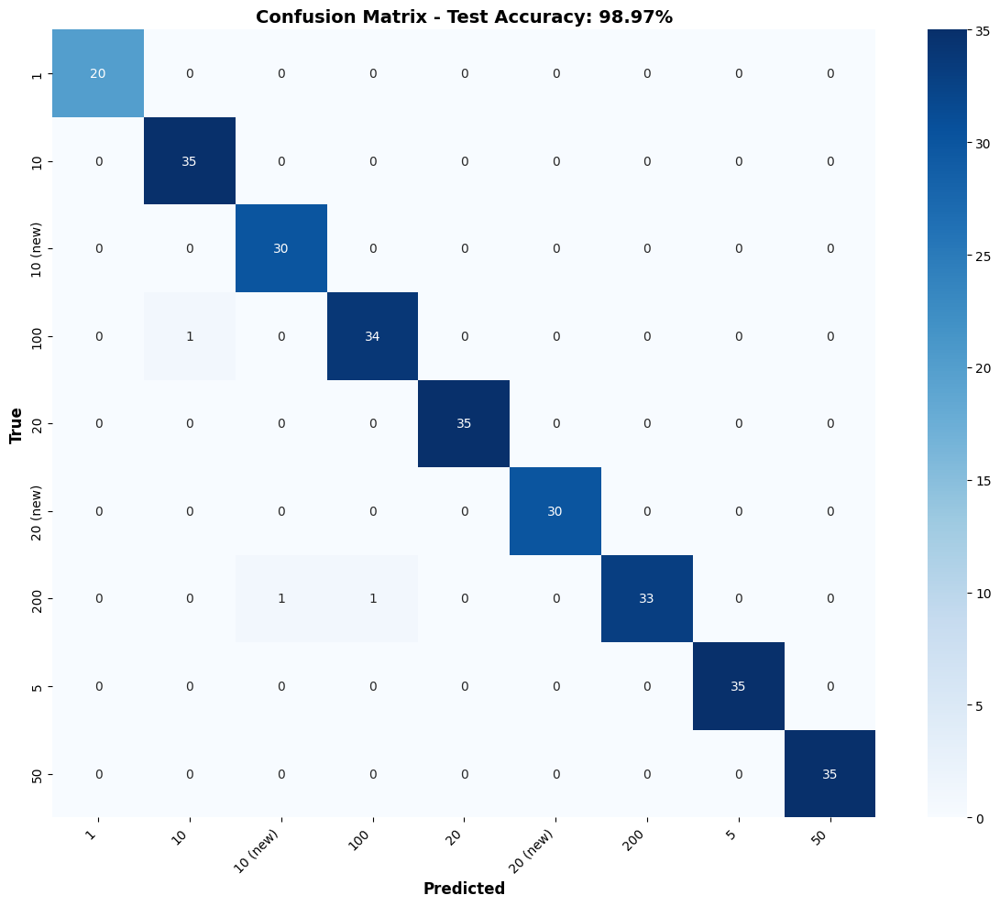

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].axhline(y=0.95, color='r', linestyle='--', label='95% Target')
axes[0].set_xlabel('Epoch', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[1].plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_xlabel('Epoch', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Loss', fontsize=12, fontweight='bold')
axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=150, bbox_inches='tight')
plt.show()

# ==================== EVALUATION ====================
print("\n" + "="*50)
print("MODEL EVALUATION")
print("="*50)

test_loss, test_accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f"\n TEST ACCURACY: {test_accuracy*100:.2f}%")
print(f" TEST LOSS: {test_loss:.4f}")

val_loss, val_accuracy = model.evaluate(X_val, y_val_cat, verbose=0)
print(f"\n VALIDATION ACCURACY: {val_accuracy*100:.2f}%")
print(f" VALIDATION LOSS: {val_loss:.4f}")

# Predictions
y_pred = model.predict(X_test, verbose=0)
y_pred_classes = np.argmax(y_pred, axis=1)

print("\n" + "="*50)
print("CLASSIFICATION REPORT")
print("="*50)
print(classification_report(y_test, y_pred_classes, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted', fontsize=12, fontweight='bold')
plt.ylabel('True', fontsize=12, fontweight='bold')
plt.title(f'Confusion Matrix - Test Accuracy: {test_accuracy*100:.2f}%', 
          fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

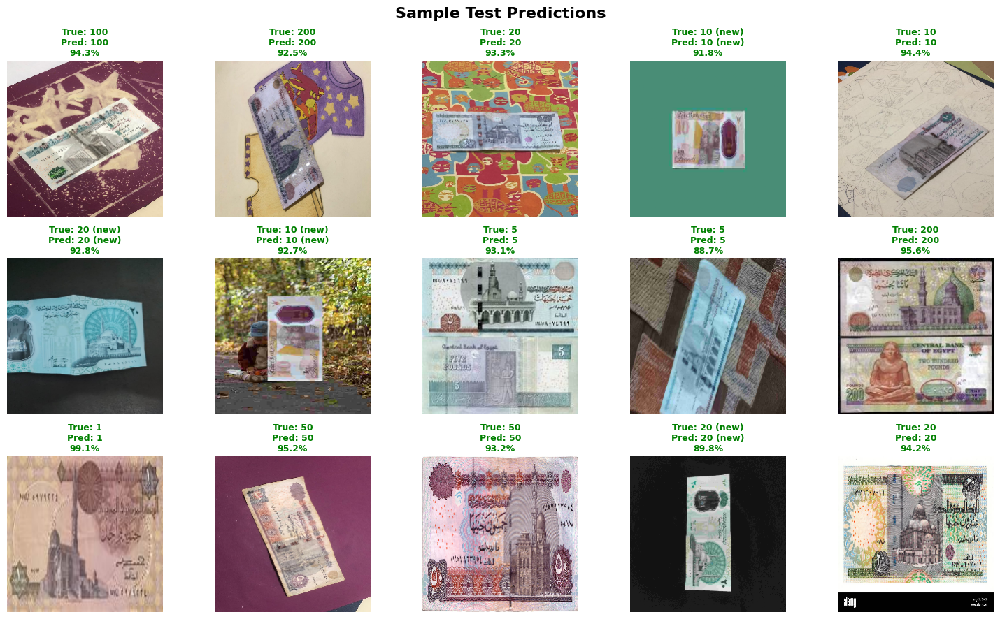

In [47]:
fig, axes = plt.subplots(3, 5, figsize=(15, 9))
fig.suptitle('Sample Test Predictions', fontsize=16, fontweight='bold')

random_indices = np.random.choice(len(X_test), 15, replace=False)

for idx, ax in enumerate(axes.flat):
    test_idx = random_indices[idx]
    ax.imshow(X_test[test_idx])
    
    true_label = class_names[y_test[test_idx]]
    pred_label = class_names[y_pred_classes[test_idx]]
    confidence = np.max(y_pred[test_idx]) * 100
    
    color = 'green' if true_label == pred_label else 'red'
    ax.set_title(f'True: {true_label}\nPred: {pred_label}\n{confidence:.1f}%',
                 fontsize=9, color=color, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.savefig('predictions.png', dpi=150, bbox_inches='tight')
plt.show()

1: 100.00%
10: 100.00%
10 (new): 100.00%
100: 97.14%
20: 100.00%
20 (new): 100.00%
200: 94.29%
5: 100.00%
50: 100.00%


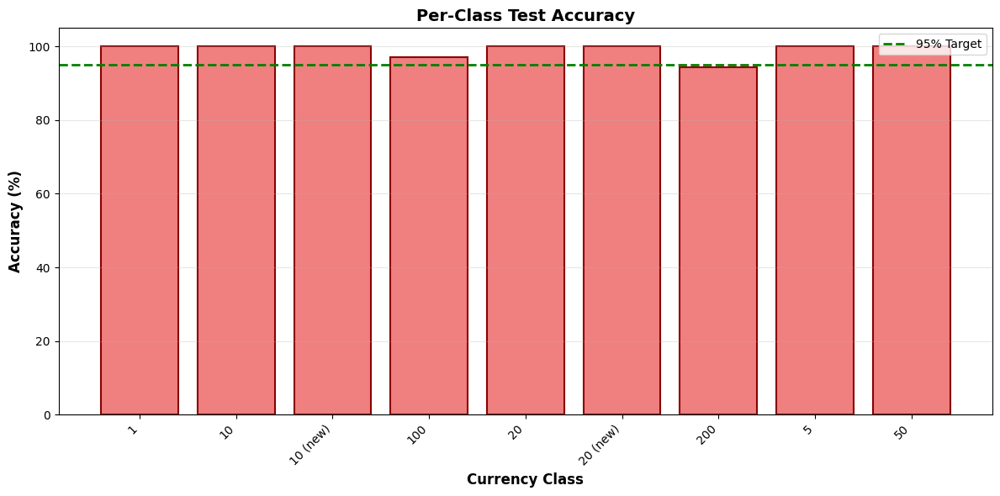

In [48]:
class_accuracies = []
for i in range(num_classes):
    class_mask = y_test == i
    if np.sum(class_mask) > 0:
        class_acc = accuracy_score(y_test[class_mask], y_pred_classes[class_mask])
        class_accuracies.append(class_acc)
        print(f"{class_names[i]}: {class_acc*100:.2f}%")

plt.figure(figsize=(12, 6))
plt.bar(class_names, [acc*100 for acc in class_accuracies], 
        color='lightcoral', edgecolor='darkred', linewidth=1.5)
plt.axhline(y=95, color='green', linestyle='--', linewidth=2, label='95% Target')
plt.xlabel('Currency Class', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
plt.title('Per-Class Test Accuracy', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.ylim([0, 105])
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('per_class_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()


 CNN ARCHITECTURE VISUALIZATION


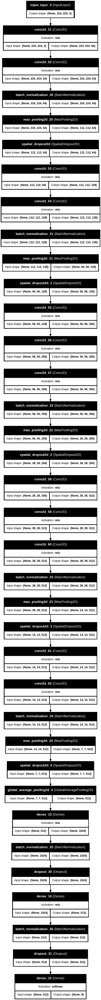

 Full architecture diagram saved as 'cnn_architecture.png'

📊 LAYER-BY-LAYER ARCHITECTURE


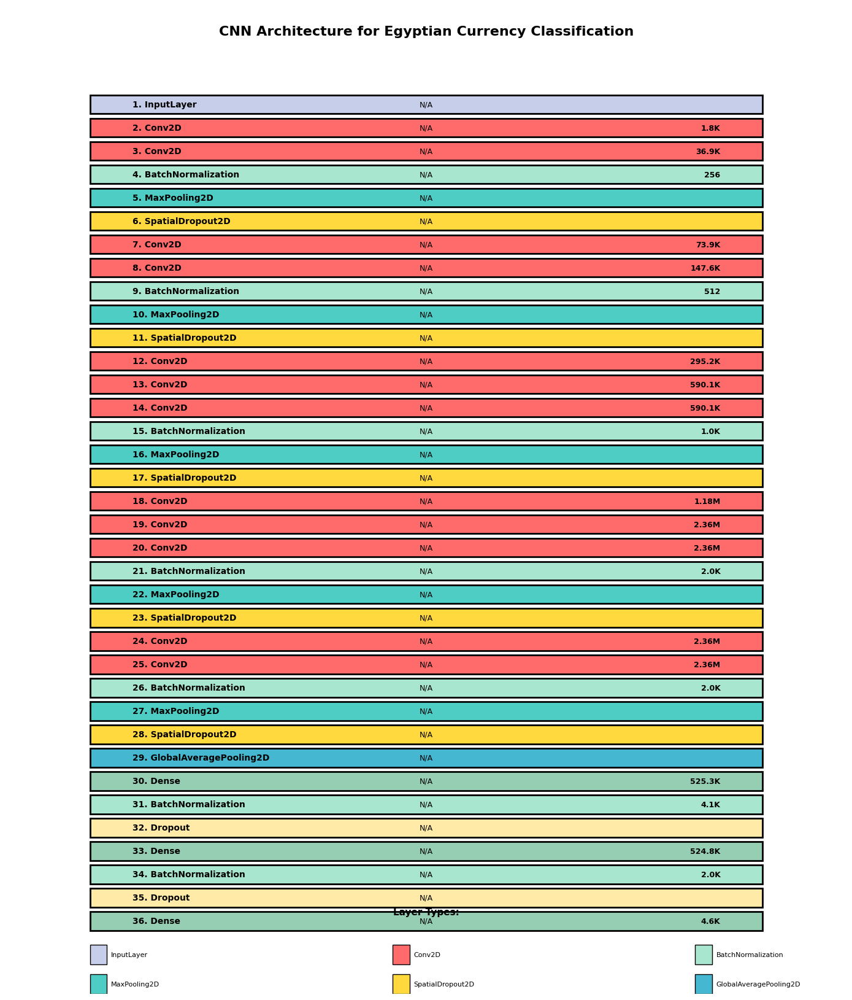

 Detailed architecture saved as 'cnn_architecture_detailed.png'

 ARCHITECTURE STATISTICS

 Total Layers: 36
 Total Parameters: 13,421,641
   └─ Trainable: 13,415,625
   └─ Non-trainable: 6,016

 Layer Type Distribution:
   └─ Conv2D: 12
   └─ BatchNormalization: 7
   └─ MaxPooling2D: 5
   └─ SpatialDropout2D: 5
   └─ Dense: 3
   └─ Dropout: 2
   └─ InputLayer: 1
   └─ GlobalAveragePooling2D: 1

 Estimated Model Size: 51.20 MB

🏗️ CONVOLUTIONAL BLOCKS STRUCTURE

BLOCK 1
  └─ InputLayer                N/A                                     0 params
  └─ Conv2D                    N/A                                 1,792 params
  └─ Conv2D                    N/A                                36,928 params
  └─ BatchNormalization        N/A                                   256 params
  └─ MaxPooling2D              N/A                                     0 params

BLOCK 2
  └─ SpatialDropout2D          N/A                                     0 params
  └─ Conv2D                    N/A  

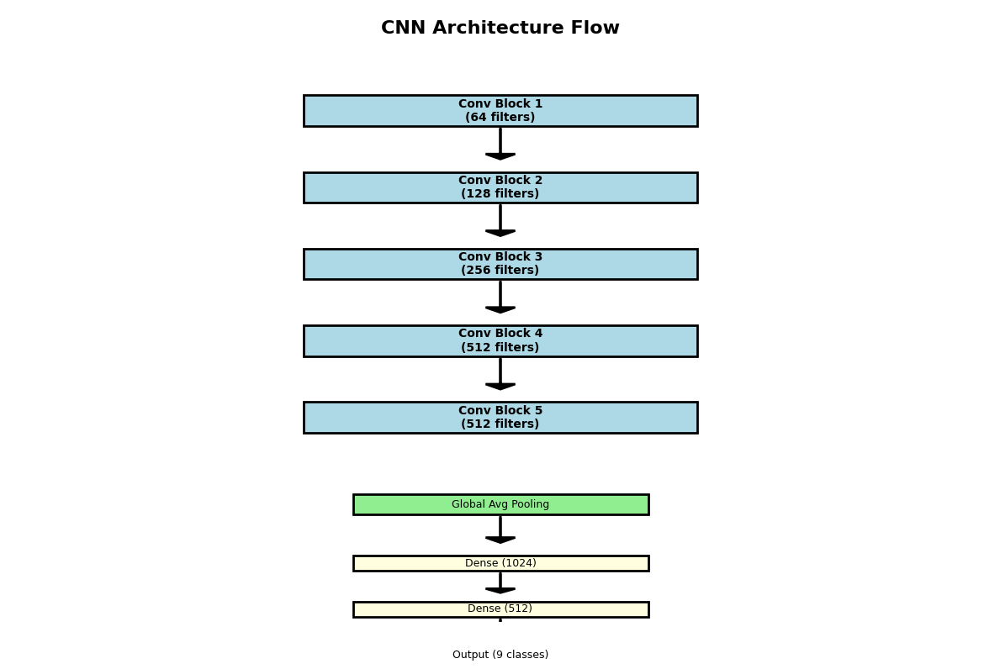

 Flow diagram saved as 'cnn_flow_diagram.png'

 ALL VISUALIZATIONS COMPLETE!

Generated files:
  1. cnn_architecture.png - Full model diagram
  2. cnn_architecture_detailed.png - Detailed layer view
  3. cnn_flow_diagram.png - Simplified flow chart


In [58]:
# ==================== VISUALIZE CNN ARCHITECTURE ====================

from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt

print("\n" + "="*70)
print(" CNN ARCHITECTURE VISUALIZATION")
print("="*70)

# Method 1: Keras plot_model (Best visualization)
try:
    plot_model(
        model,
        to_file='cnn_architecture.png',
        show_shapes=True,
        show_layer_names=True,
        rankdir='TB',  # Top to Bottom
        expand_nested=True,
        dpi=150,
        show_layer_activations=True
    )
    
    # Display the image
    from IPython.display import Image as IPImage
    display(IPImage('cnn_architecture.png'))
    
    print(" Full architecture diagram saved as 'cnn_architecture.png'")
    
except Exception as e:
    print(f" Could not create full diagram: {e}")
    print("Trying alternative visualization...")


# Method 2: Custom Visual Summary
print("\n" + "="*70)
print("📊 LAYER-BY-LAYER ARCHITECTURE")
print("="*70)

def visualize_architecture(model):
    """Create a detailed visual summary of the model"""
    
    fig, ax = plt.subplots(figsize=(14, len(model.layers) * 0.4 + 2))
    ax.axis('off')
    
    # Title
    title_text = "CNN Architecture for Egyptian Currency Classification"
    ax.text(0.5, 0.98, title_text, 
            ha='center', va='top', fontsize=16, fontweight='bold',
            transform=ax.transAxes)
    
    # Colors for different layer types
    colors = {
        'Conv2D': '#FF6B6B',
        'MaxPooling2D': '#4ECDC4',
        'GlobalAveragePooling2D': '#45B7D1',
        'Dense': '#96CEB4',
        'Dropout': '#FFEAA7',
        'SpatialDropout2D': '#FFD93D',
        'BatchNormalization': '#A8E6CF',
        'InputLayer': '#C7CEEA'
    }
    
    y_position = 0.90
    y_step = 0.85 / len(model.layers)
    
    for i, layer in enumerate(model.layers):
        layer_type = layer.__class__.__name__
        layer_name = layer.name
        
        # Get output shape
        try:
            output_shape = str(layer.output_shape)
        except:
            output_shape = "N/A"
        
        # Get parameters
        params = layer.count_params()
        
        # Determine color
        color = colors.get(layer_type, '#DFE6E9')
        
        # Draw layer box
        rect_height = y_step * 0.8
        rect = plt.Rectangle((0.1, y_position - rect_height/2), 0.8, rect_height,
                             facecolor=color, edgecolor='black', linewidth=2)
        ax.add_patch(rect)
        
        # Layer type (left)
        ax.text(0.15, y_position, f"{i+1}. {layer_type}",
               ha='left', va='center', fontsize=10, fontweight='bold')
        
        # Output shape (center)
        ax.text(0.5, y_position, f"{output_shape}",
               ha='center', va='center', fontsize=9)
        
        # Parameters (right)
        if params > 0:
            if params >= 1_000_000:
                param_text = f"{params/1_000_000:.2f}M"
            elif params >= 1_000:
                param_text = f"{params/1_000:.1f}K"
            else:
                param_text = str(params)
            
            ax.text(0.85, y_position, param_text,
                   ha='right', va='center', fontsize=9, fontweight='bold')
        
        y_position -= y_step
    
    # Legend
    legend_y = 0.05
    legend_x = 0.1
    legend_spacing = 0.12
    
    ax.text(0.5, legend_y + 0.03, "Layer Types:", 
            ha='center', fontsize=11, fontweight='bold')
    
    unique_types = []
    for layer in model.layers:
        layer_type = layer.__class__.__name__
        if layer_type not in unique_types:
            unique_types.append(layer_type)
    
    for idx, layer_type in enumerate(unique_types[:6]):  # Show first 6 types
        x_pos = legend_x + (idx % 3) * legend_spacing * 3
        y_pos = legend_y - 0.02 - (idx // 3) * 0.03
        
        color = colors.get(layer_type, '#DFE6E9')
        rect = plt.Rectangle((x_pos, y_pos), 0.02, 0.02,
                             facecolor=color, edgecolor='black')
        ax.add_patch(rect)
        
        ax.text(x_pos + 0.025, y_pos + 0.01, layer_type,
               ha='left', va='center', fontsize=8)
    
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.savefig('cnn_architecture_detailed.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(" Detailed architecture saved as 'cnn_architecture_detailed.png'")

visualize_architecture(model)


# Method 3: Summary Statistics
print("\n" + "="*70)
print(" ARCHITECTURE STATISTICS")
print("="*70)

total_params = model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
non_trainable_params = total_params - trainable_params

layer_types = {}
for layer in model.layers:
    layer_type = layer.__class__.__name__
    layer_types[layer_type] = layer_types.get(layer_type, 0) + 1

print(f"\n Total Layers: {len(model.layers)}")
print(f" Total Parameters: {total_params:,}")
print(f"   └─ Trainable: {trainable_params:,}")
print(f"   └─ Non-trainable: {non_trainable_params:,}")

print(f"\n Layer Type Distribution:")
for layer_type, count in sorted(layer_types.items(), key=lambda x: x[1], reverse=True):
    print(f"   └─ {layer_type}: {count}")

# Calculate model size
model_size_mb = (total_params * 4) / (1024 * 1024)  # Assuming float32
print(f"\n Estimated Model Size: {model_size_mb:.2f} MB")


# Method 4: Block-wise visualization
print("\n" + "="*70)
print("🏗️ CONVOLUTIONAL BLOCKS STRUCTURE")
print("="*70)

def print_blocks(model):
    """Print architecture in blocks"""
    block_num = 0
    current_block = []
    
    for layer in model.layers:
        layer_type = layer.__class__.__name__
        current_block.append(layer)
        
        # End of block detection
        if layer_type in ['MaxPooling2D', 'GlobalAveragePooling2D'] or \
           (layer_type == 'Dropout' and len(current_block) > 3):
            block_num += 1
            print(f"\n{'='*60}")
            print(f"BLOCK {block_num}")
            print(f"{'='*60}")
            
            for l in current_block:
                params = l.count_params()
                output_shape = str(l.output_shape) if hasattr(l, 'output_shape') else 'N/A'
                print(f"  └─ {l.__class__.__name__:<25} {output_shape:<30} {params:>10,} params")
            
            current_block = []
    
    # Print remaining layers (Dense layers)
    if current_block:
        block_num += 1
        print(f"\n{'='*60}")
        print(f"CLASSIFICATION HEAD")
        print(f"{'='*60}")
        
        for l in current_block:
            params = l.count_params()
            output_shape = str(l.output_shape) if hasattr(l, 'output_shape') else 'N/A'
            print(f"  └─ {l.__class__.__name__:<25} {output_shape:<30} {params:>10,} params")

print_blocks(model)


# Method 5: Graphical Flow Diagram
print("\n" + "="*70)
print("📐 SIMPLIFIED FLOW DIAGRAM")
print("="*70)

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlim(0, 10)
ax.set_ylim(0, 12)
ax.axis('off')

# Title
ax.text(5, 11.5, 'CNN Architecture Flow', 
        ha='center', fontsize=16, fontweight='bold')

# Draw flow
y = 10.5
conv_blocks = [
    "Conv Block 1\n(64 filters)",
    "Conv Block 2\n(128 filters)",
    "Conv Block 3\n(256 filters)",
    "Conv Block 4\n(512 filters)",
    "Conv Block 5\n(512 filters)"
]

for i, block in enumerate(conv_blocks):
    # Block
    rect = plt.Rectangle((3, y-0.8), 4, 0.6, 
                         facecolor='lightblue', edgecolor='black', linewidth=2)
    ax.add_patch(rect)
    ax.text(5, y-0.5, block, ha='center', va='center', fontsize=10, fontweight='bold')
    
    # Arrow
    if i < len(conv_blocks) - 1:
        ax.arrow(5, y-0.85, 0, -0.5, head_width=0.3, head_length=0.1, 
                fc='black', ec='black', linewidth=2)
    
    y -= 1.5

# Global Pooling
y -= 0.3
rect = plt.Rectangle((3.5, y-0.6), 3, 0.4, 
                     facecolor='lightgreen', edgecolor='black', linewidth=2)
ax.add_patch(rect)
ax.text(5, y-0.4, 'Global Avg Pooling', ha='center', va='center', fontsize=9)

ax.arrow(5, y-0.65, 0, -0.4, head_width=0.3, head_length=0.1, 
        fc='black', ec='black', linewidth=2)

# Dense layers
y -= 1.2
for dense_size in ['Dense (1024)', 'Dense (512)', f'Output ({num_classes} classes)']:
    rect = plt.Rectangle((3.5, y-0.5), 3, 0.3, 
                         facecolor='lightyellow', edgecolor='black', linewidth=2)
    ax.add_patch(rect)
    ax.text(5, y-0.35, dense_size, ha='center', va='center', fontsize=9)
    
    if dense_size != f'Output ({num_classes} classes)':
        ax.arrow(5, y-0.55, 0, -0.3, head_width=0.3, head_length=0.08, 
                fc='black', ec='black', linewidth=2)
    
    y -= 0.9

plt.tight_layout()
plt.savefig('cnn_flow_diagram.png', dpi=200, bbox_inches='tight')
plt.show()

print(" Flow diagram saved as 'cnn_flow_diagram.png'")

print("\n" + "="*70)
print(" ALL VISUALIZATIONS COMPLETE!")
print("="*70)
print("\nGenerated files:")
print("  1. cnn_architecture.png - Full model diagram")
print("  2. cnn_architecture_detailed.png - Detailed layer view")
print("  3. cnn_flow_diagram.png - Simplified flow chart")

In [50]:
print("FINAL SUMMARY")
print("="*70)
print(f" Enhanced CNN with L2 Regularization + Label Smoothing")
print(f" Total Parameters: {model.count_params():,}")
print(f" Training Samples: {len(X_train)}")
print(f" Validation Samples: {len(X_val)}")
print(f" Test Samples: {len(X_test)}")
print(f"\n FINAL TEST ACCURACY: {test_accuracy*100:.2f}%")
model.save('egyptian_currency_final.keras')
print("\n Model saved as 'egyptian_currency_final.keras'")

FINAL SUMMARY
 Enhanced CNN with L2 Regularization + Label Smoothing
 Total Parameters: 13,421,641
 Training Samples: 2637
 Validation Samples: 760
 Test Samples: 290

 FINAL TEST ACCURACY: 98.97%

 Model saved as 'egyptian_currency_final.keras'


In [54]:
# ==================== KAGGLE: UPLOAD & PREDICT FROM YOUR DEVICE ====================

import ipywidgets as widgets
from IPython.display import display, Image as IPImage, clear_output
import io
from PIL import Image

def create_upload_widget():
    """
    Create an upload widget for Kaggle notebooks
    """
    print("="*70)
    print(" EGYPTIAN CURRENCY PREDICTOR")
    print("="*70)
    print("\n Click the 'Upload' button below to select an image from your device")
    print("Supported formats: JPG, JPEG, PNG\n")
    
    # Create upload widget
    uploader = widgets.FileUpload(
        accept='image/*',
        multiple=True,
        description='Upload Image'
    )
    
    # Create output widget
    output = widgets.Output()
    
    def on_upload(change):
        """Handle file upload"""
        with output:
            clear_output()
            
            uploaded_files = uploader.value
            
            if not uploaded_files:
                print(" No files uploaded")
                return
            
            print(f"\n {len(uploaded_files)} file(s) uploaded successfully!\n")
            
            # Process each uploaded file
            for uploaded_file in uploaded_files:
                filename = uploaded_file['name']
                file_content = uploaded_file['content']
                
                print("\n" + "="*70)
                print(f" ANALYZING: {filename}")
                print("="*70)
                
                try:
                    # Save file temporarily
                    with open(filename, 'wb') as f:
                        f.write(file_content)
                    
                    # Make prediction
                    result = predict_currency_from_image(
                        image_path=filename,
                        model=model,
                        class_names=class_names
                    )
                    
                    if result:
                        print(f"\n FINAL PREDICTION: {result['predicted_class']}")
                        print(f" CONFIDENCE: {result['confidence']:.2f}%")
                        
                        if result['confidence'] > 95:
                            print(" Very High Confidence!")
                        elif result['confidence'] > 80:
                            print(" High Confidence")
                        elif result['confidence'] > 60:
                            print("  Moderate Confidence")
                        else:
                            print(" Low Confidence - Image may be unclear")
                    
                    # Clean up
                    import os
                    if os.path.exists(filename):
                        os.remove(filename)
                        
                except Exception as e:
                    print(f"\n Error processing {filename}: {str(e)}")
    
    # Connect the upload handler
    uploader.observe(on_upload, names='value')
    
    # Display widgets
    display(uploader)
    display(output)

# RUN THIS TO CREATE UPLOAD BUTTON
create_upload_widget()

 EGYPTIAN CURRENCY PREDICTOR

 Click the 'Upload' button below to select an image from your device
Supported formats: JPG, JPEG, PNG



FileUpload(value=(), accept='image/*', description='Upload Image', multiple=True)

Output()